<H1><center>SEAS 8515 Data Engineering - Project 3B</center></H1>
<H2><center>ML in Spark - Beats Dataset</center></H2>
<H3><center>Juan Falck, May 2024</center></H3>

# Load libraries and dataset

In [1]:
# This is required only if I run this in local machine not in Databricks

import os
import sys

os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable


In [2]:
# Increase compatibility with Databricks
from IPython.display import display as idisplay, HTML
displayHTML = lambda x: idisplay(HTML(x))
def display(*args, **kargs): pass

In [3]:
from pyspark.sql import SparkSession
from pyspark.ml import Pipeline
from pyspark.ml.feature import RegexTokenizer, StopWordsRemover, HashingTF, IDF
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from xgboost.spark import SparkXGBClassifier
from pyspark.ml.feature import VectorAssembler, StringIndexer, StandardScaler, PCA
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator


from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import MulticlassMetrics
from pyspark.sql.functions import col

import requests


# Initialize Spark session
spark = SparkSession.builder.appName("CSV Reader").getOrCreate()

#spark = SparkSession.builder \
#    .appName("XGBoost Classification") \
#    .config("spark.executor.memory", "6g") \
#    .config("spark.executor.cores", "4") \
#    .config("spark.driver.memory", "6g") \
#    .config("spark.network.timeout", "1000s") \
#    .config("spark.sql.broadcastTimeout", "1200s") \
#    .getOrCreate()


#data_path = "data/beatsdataset.csv" 

#data = spark.read.option("header", "true") \
#                 .option("inferSchema", "true") \
#                 .csv(data_path)


data_path = "https://juanfalck.com/research/beatsdataset.csv"
local_path = "/tmp/beatsdataset.csv"

response = requests.get(data_path)
with open(local_path, 'wb') as f:
    f.write(response.content)

data = spark.read.option("header", "true") \
                 .option("inferSchema", "true") \
                 .csv(local_path)

data.show()

+---+---------------+---------------+----------------+-------------------+-----------------+------------------+----------------+------------------+--------------+--------------+----------------+----------------+-----------------+----------------+-----------------+-----------------+----------------+----------------+-----------------+-----------------+----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+------------------+------------------+------------------+-------------------+---------------+---------------+-------------------+----------------------+--------------------+---------------------+------------------+---------------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+-------------------+------------------

# Review and Clean Data

In [4]:
num_rows = data.count()
print(f"Number of rows: {num_rows}")

num_columns = len(data.columns)
print(f"Number of columns: {num_columns}")


Number of rows: 2300
Number of columns: 73


In [5]:
data = data.drop("_c0")

In [6]:
#data.describe().show()
pandas_df = data.toPandas()  
pandas_df


,1-ZCRm,2-Energym,3-EnergyEntropym,4-SpectralCentroidm,5-SpectralSpreadm,6-SpectralEntropym,7-SpectralFluxm,8-SpectralRolloffm,9-MFCCs1m,10-MFCCs2m,...,63-ChromaVector8std,64-ChromaVector9std,65-ChromaVector10std,66-ChromaVector11std,67-ChromaVector12std,68-ChromaDeviationstd,69-BPM,70-BPMconf,71-BPMessentia,class
0,0.136440,0.088861,3.201201,0.262825,0.249212,1.114423,0.007003,0.256682,-22.723259,1.594074,...,0.003431,0.004981,0.010818,0.024001,0.005201,0.015056,133.333333,0.132792,128.0,BigRoom
1,0.117039,0.108389,3.194001,0.247657,0.250288,1.065668,0.005387,0.199821,-21.775871,1.261364,...,0.004461,0.006441,0.007469,0.015499,0.005589,0.019339,120.000000,0.112767,126.0,BigRoom
2,0.085308,0.128525,3.123837,0.217205,0.228652,0.789647,0.008247,0.156822,-22.472722,1.425185,...,0.001529,0.004556,0.007723,0.017482,0.002901,0.022201,133.333333,0.123373,129.0,BigRoom
3,0.103050,0.167042,3.150830,0.233593,0.245032,0.967082,0.006571,0.168083,-21.470751,1.463686,...,0.001591,0.003514,0.009477,0.023162,0.004165,0.015379,133.333333,0.158876,129.0,BigRoom
4,0.151730,0.148405,3.194498,0.293730,0.267231,1.353005,0.003872,0.292055,-21.371157,1.187854,...,0.003945,0.004131,0.011330,0.028188,0.002639,0.019079,133.333333,0.190708,129.0,BigRoom
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2295,0.123267,0.057100,3.208952,0.256296,0.251077,1.154926,0.005292,0.224646,-22.367698,1.332630,...,0.003534,0.004703,0.010987,0.032269,0.001926,0.016028,133.333333,0.210512,138.0,Trance
2296,0.142276,0.092951,3.115607,0.264407,0.255826,1.210942,0.010418,0.265019,-22.393598,1.576087,...,0.002769,0.005422,0.008997,0.027547,0.003881,0.016097,133.333333,0.186191,141.0,Trance
2297,0.125569,0.030196,3.192922,0.224583,0.216269,1.031649,0.004061,0.258191,-23.505045,1.646389,...,0.003643,0.005395,0.005646,0.014202,0.004689,0.009465,600.000000,0.142741,92.0,Trance
2298,0.118206,0.108737,3.149557,0.253396,0.246574,1.066546,0.008032,0.200640,-22.203477,1.200322,...,0.001375,0.003538,0.006213,0.035527,0.001729,0.020659,133.333333,0.232040,133.0,Trance


In [7]:
# Fix the column names

from pyspark.sql import DataFrame

def fix_column_names(df: DataFrame) -> DataFrame:
    new_columns = []
    for col_name in df.columns:
        # Replace hyphens with underscores
        new_col_name = col_name.replace('-', '_')
        
        # Add prefix if the column name starts with a number
        if new_col_name[0].isdigit():
            new_col_name = 'col_' + new_col_name
        
        new_columns.append(new_col_name)
    
    # Rename the columns in the DataFrame
    for old_col, new_col in zip(df.columns, new_columns):
        df = df.withColumnRenamed(old_col, new_col)
    
    return df


df_fixed = fix_column_names(data)
df_fixed.show()


+---------------+---------------+--------------------+-----------------------+---------------------+----------------------+-------------------+----------------------+--------------+--------------+----------------+----------------+-----------------+----------------+-----------------+-----------------+----------------+----------------+-----------------+-----------------+----------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+----------------------+----------------------+----------------------+-----------------------+---------------+----------------+-----------------------+--------------------------+------------------------+-------------------------+----------------------+-------------------------+----------------+----------------+----------------+----------------+----------------+----------------+----------------+----------------+-

In [8]:
# Address nulls

from pyspark.sql.functions import col, sum as sql_sum

df_fixed.createOrReplaceTempView("data")

# Generate SQL query to count nulls in each column
query_parts = []
for column in df_fixed.columns:
    query_part = f"SELECT '{column}' AS column_name, SUM(CASE WHEN {column} IS NULL THEN 1 ELSE 0 END) AS null_count FROM data"
    query_parts.append(query_part)

# Combine all parts of the query with UNION ALL
union_query = " UNION ALL ".join(query_parts)


null_counts_df = spark.sql(union_query)


null_counts_df.show(80, truncate=False)


+--------------------------+----------+
|column_name               |null_count|
+--------------------------+----------+
|col_1_ZCRm                |0         |
|col_2_Energym             |0         |
|col_3_EnergyEntropym      |0         |
|col_4_SpectralCentroidm   |0         |
|col_5_SpectralSpreadm     |0         |
|col_6_SpectralEntropym    |0         |
|col_7_SpectralFluxm       |0         |
|col_8_SpectralRolloffm    |0         |
|col_9_MFCCs1m             |0         |
|col_10_MFCCs2m            |0         |
|col_11_MFCCs3m            |0         |
|col_12_MFCCs4m            |0         |
|col_13_MFCCs5m            |0         |
|col_14_MFCCs6m            |0         |
|col_15_MFCCs7m            |0         |
|col_16_MFCCs8m            |0         |
|col_17_MFCCs9m            |0         |
|col_18_MFCCs10m           |0         |
|col_19_MFCCs11m           |0         |
|col_20_MFCCs12m           |0         |
|col_21_MFCCs13m           |0         |
|col_22_ChromaVector1m     |0         |


In [9]:
df_fixed.toPandas().describe()

,col_1_ZCRm,col_2_Energym,col_3_EnergyEntropym,col_4_SpectralCentroidm,col_5_SpectralSpreadm,col_6_SpectralEntropym,col_7_SpectralFluxm,col_8_SpectralRolloffm,col_9_MFCCs1m,col_10_MFCCs2m,...,col_62_ChromaVector7std,col_63_ChromaVector8std,col_64_ChromaVector9std,col_65_ChromaVector10std,col_66_ChromaVector11std,col_67_ChromaVector12std,col_68_ChromaDeviationstd,col_69_BPM,col_70_BPMconf,col_71_BPMessentia
count,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,...,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000,2300.000000
mean,0.107736,0.104252,3.110511,0.235583,0.241407,0.906137,0.010705,0.190545,-23.166806,1.681474,...,0.067540,0.002632,0.004919,0.009917,0.030616,0.004141,0.019852,148.225537,0.169310,120.948696
std,0.037105,0.040966,0.070925,0.043585,0.019559,0.341512,0.005387,0.080169,1.177417,0.558971,...,0.020457,0.001806,0.002664,0.004558,0.011572,0.002492,0.004403,46.641160,0.056806,17.101925
min,0.017122,0.004948,2.746105,0.082685,0.151738,0.034159,0.002689,0.011842,-30.378954,-0.019100,...,0.017597,0.000162,0.000500,0.002169,0.004175,0.000277,0.005532,63.157895,0.073337,61.000000
25%,0.080967,0.075864,3.065538,0.206125,0.229695,0.656444,0.006757,0.131162,-23.933393,1.275003,...,0.052684,0.001449,0.003116,0.006996,0.022527,0.002450,0.016837,120.000000,0.126604,117.000000
50%,0.107538,0.099977,3.117441,0.237552,0.243182,0.911085,0.009582,0.186282,-23.085501,1.630592,...,0.065773,0.002220,0.004425,0.008975,0.028599,0.003641,0.019591,133.333333,0.156258,125.000000
75%,0.132890,0.128128,3.163833,0.266697,0.255137,1.155127,0.013129,0.243637,-22.279678,2.037051,...,0.080211,0.003338,0.006053,0.011637,0.036699,0.005206,0.022443,150.000000,0.200570,129.000000
max,0.246659,0.281533,3.254153,0.373731,0.300685,1.958840,0.052735,0.483745,-20.129200,4.162540,...,0.143270,0.027122,0.027724,0.047819,0.096128,0.028739,0.040736,600.000000,0.422992,188.000000


In [10]:
# Take a look at the data in more detail. How many classes do we have

df_fixed.createOrReplaceTempView("data")


query = """
SELECT class, COUNT(*) as count
FROM data
GROUP BY class
ORDER BY count DESC
"""


class_counts_df = spark.sql(query)


class_counts_df.show(30)


+--------------------+-----+
|               class|count|
+--------------------+-----+
|           PsyTrance|  100|
|           HardDance|  100|
|              Breaks|  100|
|  HardcoreHardTechno|  100|
|   IndieDanceNuDisco|  100|
|              Trance|  100|
|           DeepHouse|  100|
|ElectronicaDowntempo|  100|
|           ReggaeDub|  100|
|             Minimal|  100|
|         DrumAndBass|  100|
|             Dubstep|  100|
|             BigRoom|  100|
|              Techno|  100|
|               House|  100|
|         FutureHouse|  100|
|        ElectroHouse|  100|
|           GlitchHop|  100|
|           TechHouse|  100|
|              HipHop|  100|
|           FunkRAndB|  100|
|               Dance|  100|
|    ProgressiveHouse|  100|
+--------------------+-----+



# Visualizations

## Parallel Coordinates Plot



A Parallel Coordinates Plot (PCP) is a powerful tool for visualizing multi-dimensional data. Each line in the plot represents a data point, and each axis corresponds to one of the features (or columns) in the dataset. Here's what a Parallel Coordinates Plot can tell you:

Patterns and Relationships: The PCP helps in identifying patterns and relationships among the multiple dimensions. For example, lines that stay close together across several axes might indicate a correlation between those features.

Class Separation: If the lines representing different classes (e.g., music types) are clearly separated in certain dimensions, it indicates that those features are useful for distinguishing between classes. In your case, if the lines for "pop" music consistently differ from those for "rock" music across specific parameters, these parameters are good discriminators.

Outliers: Outliers can be easily spotted as lines that deviate significantly from the rest. If a line crosses axes in a manner very different from others, it might indicate an anomaly in the data.

Feature Importance: By observing the spread and clustering of lines on each axis, you can get a sense of which features are most informative. Features where lines show a lot of spread might indicate variability within the class, while tight clustering might indicate a strong class characteristic.

Trends and Groups: You can observe trends and groupings within the data. If certain lines group together and follow a similar path, it suggests that those data points share similar characteristics.

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


df_pandas = df_fixed.toPandas()

# Parallel Coordinates Plot
# Encode music types as numerical values
df_pandas['class_encoded'] = df_pandas['class'].astype('category').cat.codes
color_scale = px.colors.qualitative.Set1

fig = go.Figure(data=
    go.Parcoords(
        line=dict(color=df_pandas['class_encoded'],
                  colorscale=color_scale,
                  showscale=True),
        dimensions=[dict(label=col, values=df_pandas[col]) for col in df_pandas.columns if col != 'class']
    )
)
fig.update_layout(title='Parallel Coordinates Plot of Sound Parameters')
fig.update_layout(
    title='Parallel Coordinates Plot of Sound Parameters',
    width=8000,  
    height=700  
)
fig.show()



## PCA PLot

In [12]:
# Principal Component Analysis (PCA)
# Standardizing the features
x = df_pandas.drop(columns=['class', 'class_encoded'])
y = df_pandas['class']
x = StandardScaler().fit_transform(x)

# PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(x)
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
final_df = pd.concat([principal_df, y], axis=1)

# Plot PCA
fig = px.scatter(final_df, x='PC1', y='PC2', color='class', title='PCA of Sound Parameters')
fig.update_traces(marker=dict(size=8))
fig.show()

## t-SNE Plot

In [13]:
from sklearn.manifold import TSNE

# Standardizing the features
x = df_pandas.drop(columns=['class'])
y = df_pandas['class']
x = StandardScaler().fit_transform(x)

# t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(x)
tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2'])
tsne_df['class'] = y

# Plot t-SNE
fig = px.scatter(tsne_df, x='TSNE1', y='TSNE2', color='class', title='t-SNE of Sound Parameters', width=800, height=600)
fig.update_traces(marker=dict(size=8))
fig.show()


## Generate Corelation Matrix

In [14]:
from pyspark.sql import functions as F
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml import Pipeline
from pyspark.sql.functions import udf
from pyspark.sql.types import DoubleType
from pyspark.ml.feature import VectorAssembler, StringIndexer, StandardScaler, PCA

# Select the 'class' column and columns to include in correlation matrix
columns_to_include = [col for col in df_fixed.columns if col != 'class']

# Index and Encode 'class'
string_indexer = StringIndexer(inputCol="class", outputCol="class_index")
one_hot_encoder = OneHotEncoder(inputCols=["class_index"], outputCols=["class_encoded"], dropLast=False)

# Build the pipeline and transform the data
pipeline = Pipeline(stages=[string_indexer, one_hot_encoder])
model = pipeline.fit(df_fixed)
df_transformed = model.transform(df_fixed)

# Drop the original 'class' and 'class_index' columns
df_transformed = df_transformed.drop("class", "class_index")

# Define a UDF to extract each bit from the vector
def extract_feature(vec, idx):
    try:
        return float(vec[idx])
    except IndexError:
        return 0.0

extract_feature_udf = udf(extract_feature, DoubleType())

# Using the actual size of categories encoded by OneHotEncoder
num_categories = model.stages[1].categorySizes[0]
categories = model.stages[0].labels

for i in range(num_categories):
    df_transformed = df_transformed.withColumn(f'class_{categories[i]}', extract_feature_udf(F.col('class_encoded'), F.lit(i)))

# Convert to Pandas DataFrame for correlation matrix
pandas_df = df_transformed.drop('class_encoded').toPandas()

# Calculate the correlation matrix
correlation_matrix = pandas_df.corr()

# Show the correlation matrix
correlation_matrix


,col_1_ZCRm,col_2_Energym,col_3_EnergyEntropym,col_4_SpectralCentroidm,col_5_SpectralSpreadm,col_6_SpectralEntropym,col_7_SpectralFluxm,col_8_SpectralRolloffm,col_9_MFCCs1m,col_10_MFCCs2m,...,class_HipHop,class_House,class_IndieDanceNuDisco,class_Minimal,class_ProgressiveHouse,class_PsyTrance,class_ReggaeDub,class_TechHouse,class_Techno,class_Trance
col_1_ZCRm,1.000000,0.033078,0.348539,0.912761,0.595759,0.962675,-0.561186,0.978607,0.395775,-0.767940,...,0.087839,0.127421,-0.090819,-0.198311,-0.190814,-0.124676,-0.054953,0.057078,-0.095969,0.120659
col_2_Energym,0.033078,1.000000,0.288607,0.197469,0.272648,0.071985,-0.019159,0.039412,0.567044,-0.231601,...,0.111305,-0.053051,-0.179702,-0.031875,-0.100618,0.027985,-0.101294,-0.083064,0.002975,-0.103208
col_3_EnergyEntropym,0.348539,0.288607,1.000000,0.336717,0.183286,0.453793,-0.644043,0.355155,0.690856,-0.465106,...,0.120359,-0.026511,-0.183745,-0.280486,-0.048434,-0.025141,-0.062094,-0.143282,-0.106865,0.246116
col_4_SpectralCentroidm,0.912761,0.197469,0.336717,1.000000,0.839873,0.869310,-0.513196,0.906615,0.422951,-0.734098,...,0.084191,0.088965,-0.101393,-0.181165,-0.190473,-0.142577,-0.071225,0.060786,-0.074734,0.094537
col_5_SpectralSpreadm,0.595759,0.272648,0.183286,0.839873,1.000000,0.513057,-0.318957,0.583824,0.338512,-0.399129,...,-0.002329,0.040085,-0.053870,-0.122656,-0.116615,-0.132398,-0.080610,0.060062,-0.025043,0.070104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
class_PsyTrance,-0.124676,0.027985,-0.025141,-0.142577,-0.132398,-0.095331,0.148057,-0.120256,0.024493,0.043663,...,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,1.000000,-0.045455,-0.045455,-0.045455,-0.045455
class_ReggaeDub,-0.054953,-0.101294,-0.062094,-0.071225,-0.080610,-0.042638,-0.009727,-0.067931,-0.074123,-0.031035,...,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,1.000000,-0.045455,-0.045455,-0.045455
class_TechHouse,0.057078,-0.083064,-0.143282,0.060786,0.060062,0.004696,0.100246,0.058637,-0.145078,0.058853,...,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,1.000000,-0.045455,-0.045455
class_Techno,-0.095969,0.002975,-0.106865,-0.074734,-0.025043,-0.113659,0.144392,-0.086653,-0.069792,0.122401,...,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,-0.045455,1.000000,-0.045455


## Corelation HeatMap

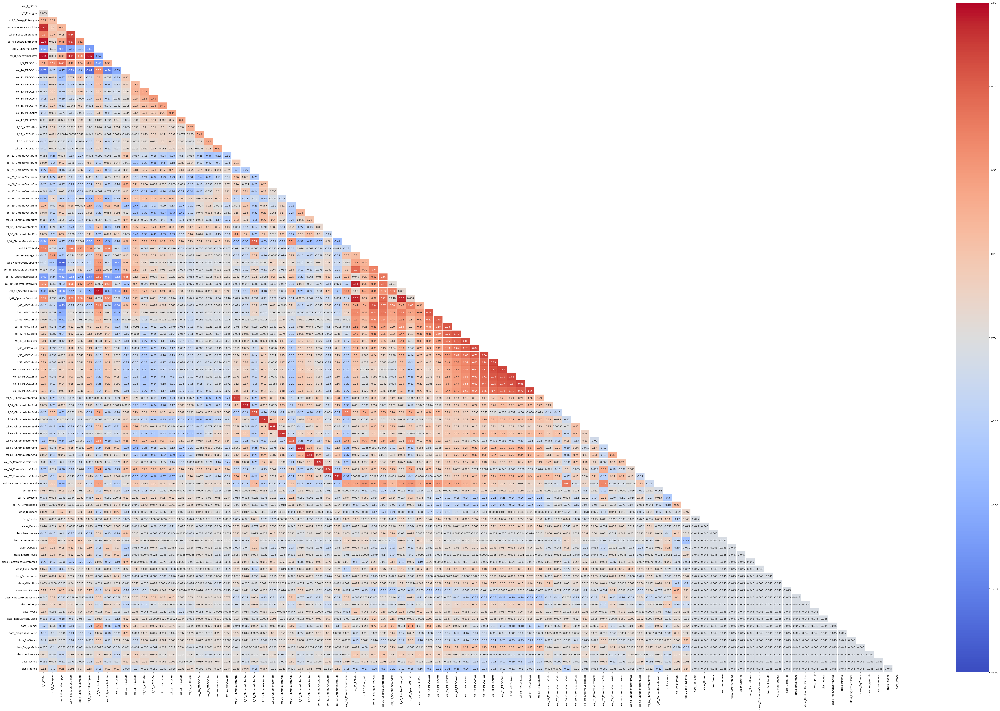

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(80, 50))

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

ax = sns.heatmap(correlation_matrix, mask=mask, xticklabels=correlation_matrix.columns, yticklabels=correlation_matrix.columns, annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)

# Machine Learning - XGBoost

### Simple XGBoost solution

In [16]:
# Splitting the data into train and test sets
(train_data, test_data) = df_fixed.randomSplit([0.8, 0.2], seed=42)

#Setup the StringIndexer for the class column
label_indexer = StringIndexer(inputCol="class", outputCol="indexedClass").fit(df_fixed)

# Assembling the feature columns into a single vector column
feature_columns = [col for col in df_fixed.columns if col != 'class']
assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")

# Normalize the feature vectors
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=False)

# Configure the XGBoost Classifier
xgb_classifier = SparkXGBClassifier(
    features_col="scaledFeatures",  # Update to use the scaled features
    label_col="indexedClass",  # Update to use the indexed labels
    prediction_col="prediction",
    numClass=23,
    max_depth=3,
    n_estimators=100,
    learning_rate = 0.1,
    numWorkers=1  # Adjust based on your cluster configuration
)

# Pipeline Creation and Model Training
pipeline = Pipeline(stages=[label_indexer, assembler, scaler, xgb_classifier])
model = pipeline.fit(train_data)

# Model Testing
predictions = model.transform(test_data)
evaluator = MulticlassClassificationEvaluator(
    labelCol="indexedClass", 
    predictionCol="prediction", 
    metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print(f"Test Accuracy: {accuracy:.2f}")


2024-05-17 19:38:08,107 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'objective': 'multi:softprob', 'device': 'cpu', 'learning_rate': 0.1, 'max_depth': 3, 'numClass': 23, 'numWorkers': 1, 'num_class': 23, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-05-17 19:38:17,820 INFO XGBoost-PySpark: _fit Finished xgboost training!


Test Accuracy: 0.57


### Gridsearch with XGBoost

In [17]:

# Splitting the data into train and test sets
(train_data, test_data) = df_fixed.randomSplit([0.8, 0.2], seed=42)

# Setup the StringIndexer for the class column
label_indexer = StringIndexer(inputCol="class", outputCol="indexedClass").fit(df_fixed)

# Assembling the feature columns into a single vector column
feature_columns = [col for col in df_fixed.columns if col != 'class']
assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")

# Normalize the feature vectors
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=False)

# Configure the XGBoost Classifier
xgb_classifier = SparkXGBClassifier(
    features_col="scaledFeatures",
    label_col="indexedClass",
    prediction_col="prediction",
    numClass=23,
    numWorkers=1  # Adjust based on your cluster configuration
)

# Configuring all stages in the pipeline
pipeline = Pipeline(stages=[
    label_indexer,
    assembler,
    scaler,
    xgb_classifier
])



# Create the parameter grid for Grid Search
paramGrid = ParamGridBuilder() \
    .addGrid(xgb_classifier.max_depth, [3,5,7]) \
    .addGrid(xgb_classifier.n_estimators, [80,100,120]) \
    .build()

# Define the evaluator for Multiclass Classification
evaluator = MulticlassClassificationEvaluator(
    labelCol="indexedClass",
    predictionCol="prediction",
    metricName="accuracy")

# Set up the Cross Validator with the pipeline
crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=evaluator,
                          numFolds=5)  # You can choose the number of folds

# Fit the model using Cross Validation to find the best model
cvModel = crossval.fit(train_data)


2024-05-17 19:38:22,572 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'device': 'cpu', 'max_depth': 3, 'objective': 'multi:softprob', 'numClass': 23, 'numWorkers': 1, 'num_class': 23, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 80}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-05-17 19:38:29,818 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:38:32,991 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'device': 'cpu', 'max_depth': 3, 'objective': 'multi:softprob', 'numClass': 23, 'numWorkers': 1, 'num_class': 23, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-05-17 19:38:40,772 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:38:43,863 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'device': 'cpu', '

2024-05-17 19:42:05,128 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:42:08,460 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'device': 'cpu', 'max_depth': 3, 'objective': 'multi:softprob', 'numClass': 23, 'numWorkers': 1, 'num_class': 23, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 100}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-05-17 19:42:16,476 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:42:19,782 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'device': 'cpu', 'max_depth': 3, 'objective': 'multi:softprob', 'numClass': 23, 'numWorkers': 1, 'num_class': 23, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 120}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-05-17 19:42:28,649 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:42:31,894 INFO XGBoost-PySpark: _f

2024-05-17 19:46:07,748 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:46:10,906 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'device': 'cpu', 'max_depth': 3, 'objective': 'multi:softprob', 'numClass': 23, 'numWorkers': 1, 'num_class': 23, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 120}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-05-17 19:46:19,505 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:46:22,671 INFO XGBoost-PySpark: _fit Running xgboost-2.0.3 on 1 workers with
	booster params: {'device': 'cpu', 'max_depth': 5, 'objective': 'multi:softprob', 'numClass': 23, 'numWorkers': 1, 'num_class': 23, 'nthread': 1}
	train_call_kwargs_params: {'verbose_eval': True, 'num_boost_round': 80}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
2024-05-17 19:46:31,303 INFO XGBoost-PySpark: _fit Finished xgboost training!
2024-05-17 19:46:34,407 INFO XGBoost-PySpark: _fi

In [18]:
bestModel = cvModel.bestModel.stages[-1]
print("Best Parameters Found:")
print(f"Learning Rate: {bestModel.getOrDefault('learning_rate')}")
print(f"Max Depth: {bestModel.getOrDefault('max_depth')}")
print(f"Number of Estimators: {bestModel.getOrDefault('n_estimators')}")


Best Parameters Found:
Learning Rate: None
Max Depth: 3
Number of Estimators: 100


## Make predictions on test data

In [19]:
# Make predictions on test data
predictions = cvModel.bestModel.transform(test_data)

# Create evaluators
evaluator_accuracy = MulticlassClassificationEvaluator(
    labelCol="indexedClass", predictionCol="prediction", metricName="accuracy")
evaluator_precision = MulticlassClassificationEvaluator(
    labelCol="indexedClass", predictionCol="prediction", metricName="weightedPrecision")
evaluator_recall = MulticlassClassificationEvaluator(
    labelCol="indexedClass", predictionCol="prediction", metricName="weightedRecall")

# Compute metrics
accuracy = evaluator_accuracy.evaluate(predictions)
precision = evaluator_precision.evaluate(predictions)
recall = evaluator_recall.evaluate(predictions)

print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")

Accuracy: 0.55
Precision: 0.56
Recall: 0.55


### Generate Confusion Matrix

In [20]:
# Convert DataFrame to RDD
rdd = predictions.select(['prediction', 'indexedClass']).rdd.map(tuple)

# Instantiate metrics object
metrics = MulticlassMetrics(rdd)

# Confusion matrix
confusion_matrix = metrics.confusionMatrix().toArray()

print("Confusion Matrix:\n", confusion_matrix)


C:\apps\spark-3.3.0-bin-hadoop3\python\pyspark\sql\context.py:157: FutureWarning:

Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.



Confusion Matrix:
 [[12.  0.  0.  0.  0.  0.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.
   0.  0.  0.  0.  2.]
 [ 1. 10.  0.  0.  2.  0.  2.  0.  0.  0.  0.  0.  1.  2.  0.  0.  0.  0.
   0.  0.  0.  0.  1.]
 [ 0.  0.  5.  0.  0.  0.  0.  0.  0.  2.  4.  0.  0.  1.  3.  0.  0.  0.
   0.  0.  0.  1.  0.]
 [ 0.  0.  1.  7.  0.  0.  0.  3.  3.  0.  0.  0.  0.  0.  1.  2.  0.  1.
   0.  0.  3.  0.  0.]
 [ 0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.
   0.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  1. 13.  0.  0.  0.  0.  0.  2.  0.  2.  0.  0.  0.  0.
   0.  0.  0.  0.  0.]
 [ 5.  2.  0.  0.  0.  0. 10.  0.  0.  1.  0.  0.  1.  1.  0.  0.  0.  0.
   0.  0.  0.  0.  0.]
 [ 1.  1.  0.  1.  0.  0.  1.  7.  1.  0.  0.  0.  0.  0.  0.  1.  1.  0.
   0.  0.  1.  2.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0. 12.  0.  1.  0.  0.  0.  0.  2.  0.  0.
   0.  1.  0.  0.  0.]
 [ 0.  0.  4.  0.  0.  0.  3.  0.  0.  8.  0.  0.  0.  0.  4.  0.  1.  0.
   0.  0.  0.  1.  1.]
 [ 0.  0.  

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'category_names' is a list of category names corresponding to 'indexedClass' values
category_names = ["PsyTrance",
                  "HardDance",
                  "Breaks",
                  "HardcoreHardTechno",
                  "IndieDanceNuDisco",
                  "Trance",
                  "DeepHouse",
                  "ElectronicaDowntempo",
                  "ReggaeDub",
                  "Minimal",
                  "DrumAndBass",
                  "Dubstep",
                  "BigRoom",
                  "Techno",
                  "House",
                  "FutureHouse",
                  "ElectroHouse",
                  "GlitchHop",
                  "TechHouse",
                  "HipHop",
                  "FunkRAndB",
                  "Dance",
                  "ProgressiveHouse"] 

# Convert the confusion matrix to a DataFrame
confusion_df = pd.DataFrame(confusion_matrix, index=category_names, columns=category_names)

# Display the DataFrame for verification (optional)
print("Confusion Matrix:")
confusion_df



Confusion Matrix:


,PsyTrance,HardDance,Breaks,HardcoreHardTechno,IndieDanceNuDisco,Trance,DeepHouse,ElectronicaDowntempo,ReggaeDub,Minimal,...,Techno,House,FutureHouse,ElectroHouse,GlitchHop,TechHouse,HipHop,FunkRAndB,Dance,ProgressiveHouse
PsyTrance,12.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0
HardDance,1.0,10.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
Breaks,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
HardcoreHardTechno,0.0,0.0,1.0,7.0,0.0,0.0,0.0,3.0,3.0,0.0,...,0.0,1.0,2.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0
IndieDanceNuDisco,0.0,0.0,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
Trance,0.0,0.0,0.0,0.0,1.0,13.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
DeepHouse,5.0,2.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ElectronicaDowntempo,1.0,1.0,0.0,1.0,0.0,0.0,1.0,7.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,2.0,0.0
ReggaeDub,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
Minimal,0.0,0.0,4.0,0.0,0.0,0.0,3.0,0.0,0.0,8.0,...,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0


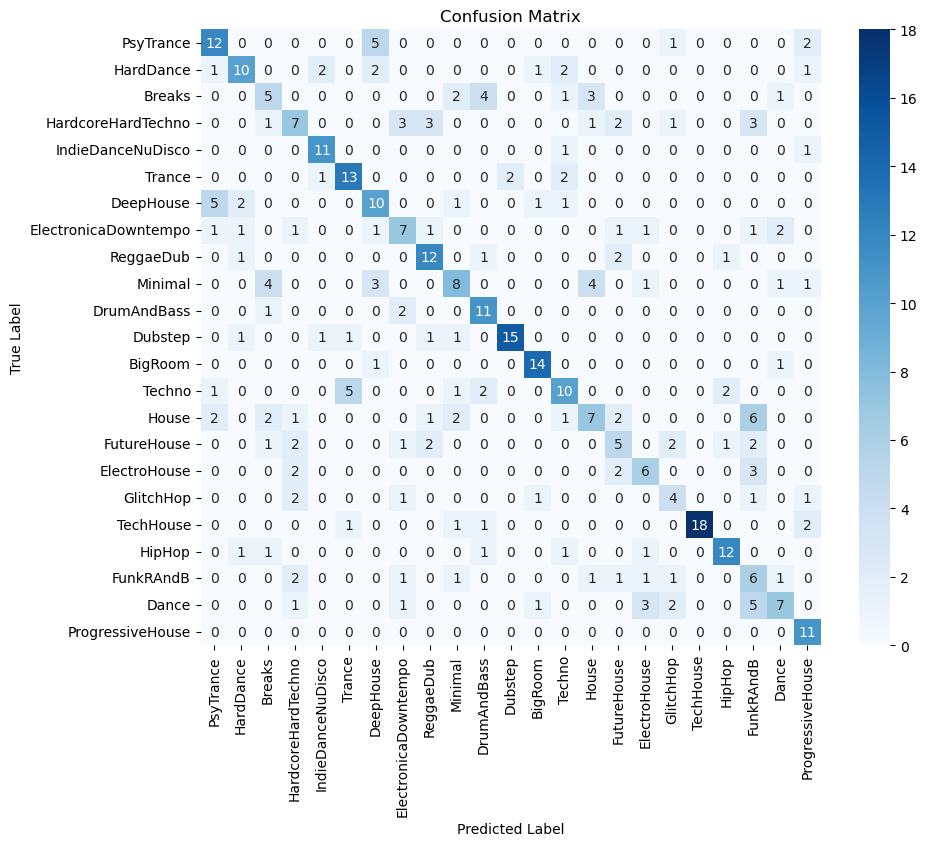

In [22]:
# Visualize the confusion matrix using Seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_df, annot=True, fmt='g', cmap='Blues')  # 'fmt' is set to 'g' to avoid scientific notation
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# Variable importance

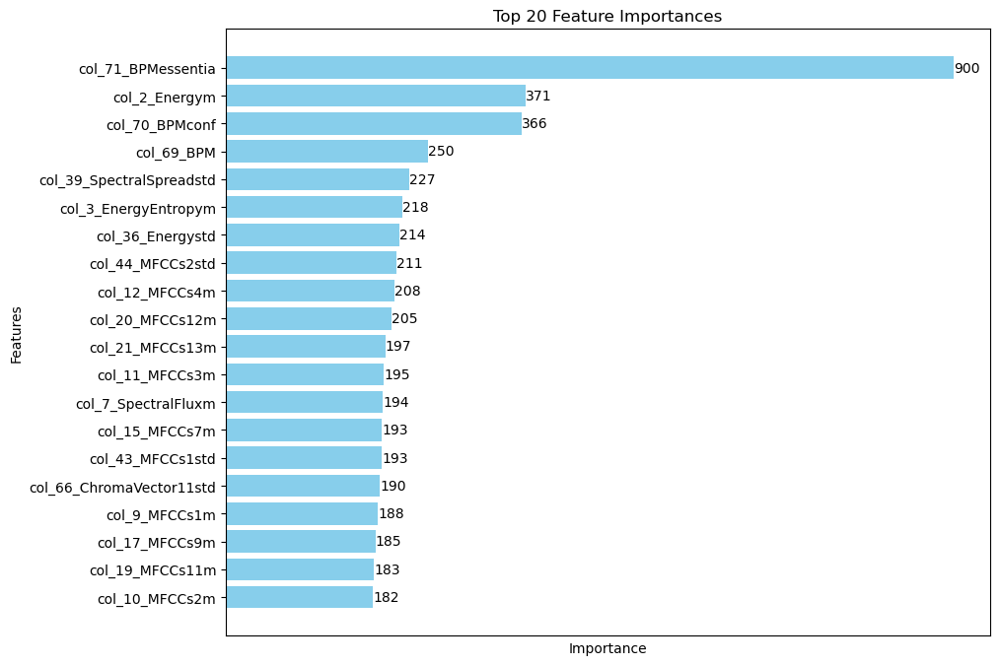

In [23]:
import matplotlib.pyplot as plt

# Retrieve the best model
best_model = cvModel.bestModel.stages[-1]  # Assuming XGBoost is the last stage in the pipeline

# Get feature importances
importances_dict = best_model.get_feature_importances()

# Map "f" indices to actual feature names
feature_importance_dict = {feature_columns[int(k[1:])]: v for k, v in importances_dict.items()}

# Sort features by importance and select top 20
sorted_features = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)[:20]


features, scores = zip(*sorted_features)

# Plotting
plt.figure(figsize=(10, 8))
bars = plt.barh(features, scores, color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 20 Feature Importances')
plt.gca().invert_yaxis()  # Invert the y-axis to show the highest importance at the top

plt.xticks([])

# Add value labels to each bar
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.0f}', 
             va='center')

plt.show()


## SVM

In [24]:
# This is required only if I run this in local machine not in Databricks

import os
import sys

os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable


In [25]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import StringIndexer, VectorAssembler, StandardScaler
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.linalg import Vectors
import pandas as pd
import numpy as np
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler as SklearnStandardScaler
from sklearn.pipeline import Pipeline as SklearnPipeline
from sklearn.metrics import accuracy_score

# Create Spark session
spark = SparkSession.builder.appName("SVM with RBF Kernel").getOrCreate()

# Load your data
data_path = "/tmp/beatsdataset.csv"
df_fixed = spark.read.csv(data_path, header=True, inferSchema=True)

# Splitting the data into train and test sets
(train_data, test_data) = df_fixed.randomSplit([0.8, 0.2], seed=42)

# Setup the StringIndexer for the class column
label_indexer = StringIndexer(inputCol="class", outputCol="indexedClass").fit(df_fixed)

# Assembling the feature columns into a single vector column
feature_columns = [col for col in df_fixed.columns if col != 'class']
assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")

# Normalize the feature vectors
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=False)

# Transform the data using the Spark pipeline
pipeline = Pipeline(stages=[label_indexer, assembler, scaler])
transformed_train_data = pipeline.fit(train_data).transform(train_data)
transformed_test_data = pipeline.fit(train_data).transform(test_data)

# Convert to pandas for sklearn processing
train_df = transformed_train_data.select("scaledFeatures", "indexedClass").toPandas()
test_df = transformed_test_data.select("scaledFeatures", "indexedClass").toPandas()

X_train = np.vstack(train_df["scaledFeatures"].apply(lambda x: np.array(x.toArray())).values)
y_train = train_df["indexedClass"].values
X_test = np.vstack(test_df["scaledFeatures"].apply(lambda x: np.array(x.toArray())).values)
y_test = test_df["indexedClass"].values

# SVM with RBF kernel using sklearn
svm_pipeline = SklearnPipeline([
    ('scaler', SklearnStandardScaler()),
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale'))
])

# Train the model
svm_pipeline.fit(X_train, y_train)

# Predict on the test set
predictions = svm_pipeline.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
print(f"Test Accuracy: {accuracy:.2f}")

# Convert predictions back to Spark DataFrame for further Spark-based processing if needed
test_df['prediction'] = predictions
test_df['scaledFeatures'] = test_df['scaledFeatures'].apply(lambda x: Vectors.dense(x))

# Convert to list of Row objects for Spark DataFrame creation
from pyspark.sql import Row
predictions_spark = spark.createDataFrame(test_df.apply(lambda row: Row(scaledFeatures=row['scaledFeatures'], indexedClass=row['indexedClass'], prediction=row['prediction']), axis=1))

# If needed, evaluate using Spark's MulticlassClassificationEvaluator
evaluator = MulticlassClassificationEvaluator(
    labelCol="indexedClass", 
    predictionCol="prediction", 
    metricName="accuracy"
)
accuracy_spark = evaluator.evaluate(predictions_spark)
print(f"Test Accuracy (evaluated in Spark): {accuracy_spark:.2f}")


Test Accuracy: 0.62
Test Accuracy (evaluated in Spark): 0.62


In [ ]:
#################### Other code #####################################

In [ ]:
# Get the list of stages in the best model's pipeline
for i, stage in enumerate(cvModel.bestModel.stages):
    print(f"Stage {i}: {stage.__class__.__name__}")

In [ ]:
# Stop Spark session
spark.stop()
